#CASE STUDY ON UNSUPERVISED LEARNING

###Import required libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn import datasets


##Read the dataset to python environment

In [10]:
wine=pd.read_csv('/content/Wine_clust .csv')

In [11]:
wine

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


# PRE - PROCESSING

## Check basic information

In [12]:
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Alcohol               178 non-null    float64
 1   Malic_Acid            178 non-null    float64
 2   Ash                   178 non-null    float64
 3   Ash_Alcanity          178 non-null    float64
 4   Magnesium             178 non-null    int64  
 5   Total_Phenols         178 non-null    float64
 6   Flavanoids            178 non-null    float64
 7   Nonflavanoid_Phenols  178 non-null    float64
 8   Proanthocyanins       178 non-null    float64
 9   Color_Intensity       178 non-null    float64
 10  Hue                   178 non-null    float64
 11  OD280                 178 non-null    float64
 12  Proline               178 non-null    int64  
dtypes: float64(11), int64(2)
memory usage: 18.2 KB


There are no null values present in the given dataset. Also all variables are numerical type.

## Checking for null values

In [13]:
wine.isna().sum()

Alcohol                 0
Malic_Acid              0
Ash                     0
Ash_Alcanity            0
Magnesium               0
Total_Phenols           0
Flavanoids              0
Nonflavanoid_Phenols    0
Proanthocyanins         0
Color_Intensity         0
Hue                     0
OD280                   0
Proline                 0
dtype: int64

No null values present

All outliers are removed

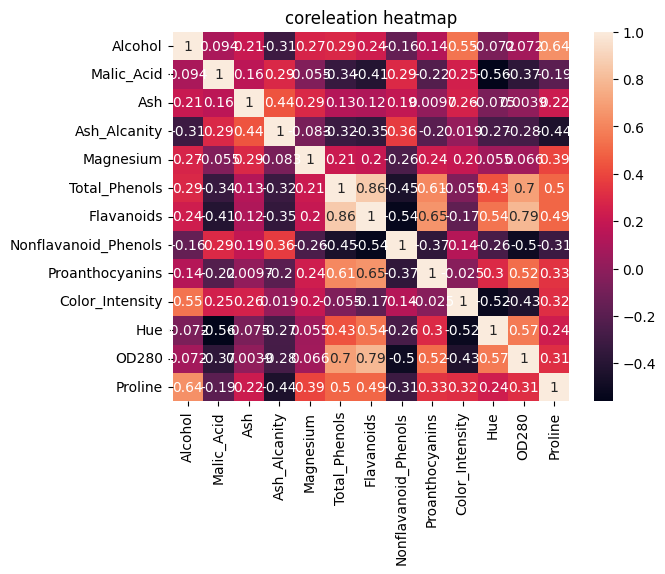

In [14]:
# Plotting heatmap to understand corelation between features
sns.heatmap(wine.corr(),annot=True)
plt.title("coreleation heatmap")
plt.show()

In [15]:

#making the corelation matrix with strong corelations only
def plot_corr_matrix(wine):
  corr_matrix = wine.corr()
  for column in wine.corr():
      corr_matrix[column] = corr_matrix[column].apply(lambda x: x if abs(x) > 0.7 and abs(x)<1 else '')

  return corr_matrix

In [16]:
plot_corr_matrix(wine)

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
Alcohol,,,,,,,,,,,,,
Malic_Acid,,,,,,,,,,,,,
Ash,,,,,,,,,,,,,
Ash_Alcanity,,,,,,,,,,,,,
Magnesium,,,,,,,,,,,,,
Total_Phenols,,,,,,,0.864564,,,,,,
Flavanoids,,,,,,0.864564,,,,,,0.787194,
Nonflavanoid_Phenols,,,,,,,,,,,,,
Proanthocyanins,,,,,,,,,,,,,
Color_Intensity,,,,,,,,,,,,,


In [ ]:

#Kmeans
# Trying to fit on the entire data

In [17]:
X= wine.values
X

array([[1.423e+01, 1.710e+00, 2.430e+00, ..., 1.040e+00, 3.920e+00,
        1.065e+03],
       [1.320e+01, 1.780e+00, 2.140e+00, ..., 1.050e+00, 3.400e+00,
        1.050e+03],
       [1.316e+01, 2.360e+00, 2.670e+00, ..., 1.030e+00, 3.170e+00,
        1.185e+03],
       ...,
       [1.327e+01, 4.280e+00, 2.260e+00, ..., 5.900e-01, 1.560e+00,
        8.350e+02],
       [1.317e+01, 2.590e+00, 2.370e+00, ..., 6.000e-01, 1.620e+00,
        8.400e+02],
       [1.413e+01, 4.100e+00, 2.740e+00, ..., 6.100e-01, 1.600e+00,
        5.600e+02]])

##KMeans Clustering

In [139]:
from sklearn.cluster import KMeans

In [18]:
wcss=[]
for i in range(2,20):
    kmeans = KMeans(n_clusters=i, init="k-means++", random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

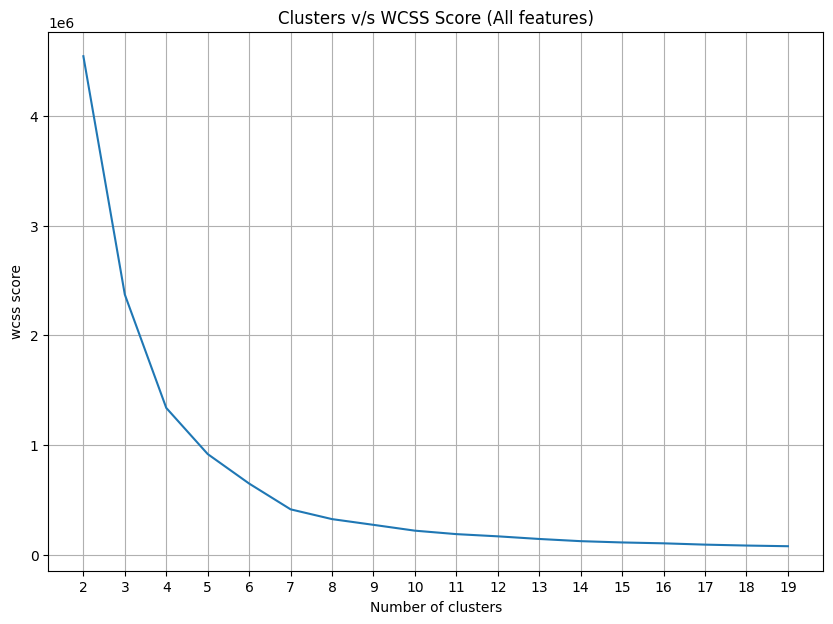

In [19]:

# plotting the elbow curve

plt.figure(figsize=(10,7))
plt.plot(range(2,20), wcss)
plt.xticks(np.arange(2,20,1))
plt.xlabel("Number of clusters")
plt.ylabel("wcss score")
plt.grid(True)
plt.title("Clusters v/s WCSS Score (All features)")
plt.show()

In [ ]:
#No of clusters:4

In [20]:

kmeans_4_clusters = KMeans(n_clusters=4, init="k-means++", random_state=42)
#fitting and predicting on the data
y_kmeans_4 = kmeans_4_clusters.fit_predict(X)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [21]:
y_kmeans_4

array([1, 1, 3, 3, 2, 3, 3, 3, 1, 1, 3, 3, 3, 1, 3, 3, 3, 1, 3, 1, 2, 2,
       1, 1, 1, 2, 3, 3, 1, 1, 3, 3, 1, 3, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2,
       1, 1, 1, 1, 1, 3, 1, 3, 3, 3, 1, 1, 1, 3, 3, 0, 2, 0, 2, 0, 0, 2,
       0, 0, 2, 2, 1, 0, 0, 1, 1, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 2,
       2, 2, 0, 0, 0, 0, 0, 1, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2,
       2, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0,
       2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0, 1, 2, 0, 2, 2, 0, 0, 0, 0, 2,
       2, 2, 0, 1, 2, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0, 2, 2, 2, 1,
       1, 2], dtype=int32)

In [22]:

kmeans_copy1 = wine.copy()

In [23]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=3)
kmeans.fit(kmeans_copy1)

kmeans_copy1['cluster'] = kmeans.labels_


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


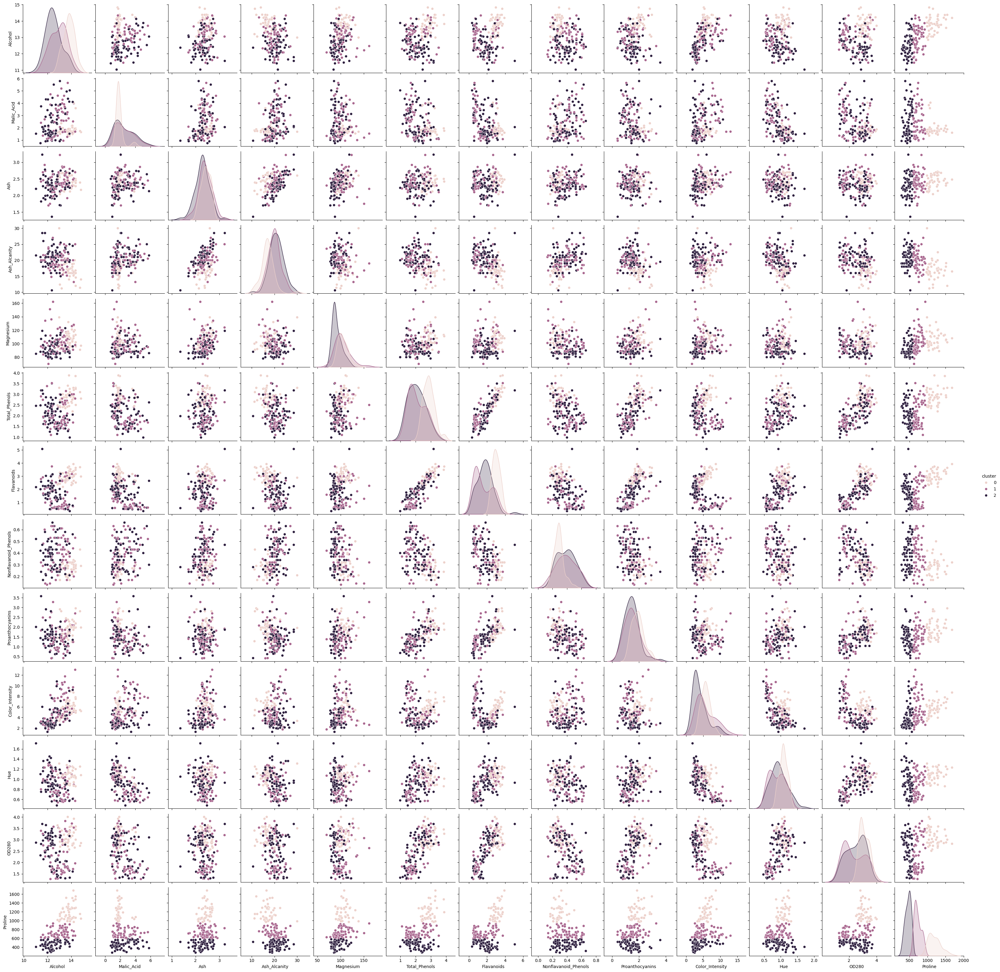

In [25]:
sns.pairplot(data=kmeans_copy1, hue='cluster')

In [26]:
# checking the accuracy of the clustering using silouhette score
from sklearn.metrics import silhouette_score
silhouette_score(X,y_kmeans_4)

0.5572288268257268

In [27]:
#StandardScaler
from sklearn.preprocessing import StandardScaler
scaled_data = StandardScaler().fit_transform(wine)
scaled_df = pd.DataFrame(scaled_data, columns=wine.columns)
scaled_df

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009
1,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242
2,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148
3,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574
4,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,0.876275,2.974543,0.305159,0.301803,-0.332922,-0.985614,-1.424900,1.274310,-0.930179,1.142811,-1.392758,-1.231206,-0.021952
174,0.493343,1.412609,0.414820,1.052516,0.158572,-0.793334,-1.284344,0.549108,-0.316950,0.969783,-1.129518,-1.485445,0.009893
175,0.332758,1.744744,-0.389355,0.151661,1.422412,-1.129824,-1.344582,0.549108,-0.422075,2.224236,-1.612125,-1.485445,0.280575
176,0.209232,0.227694,0.012732,0.151661,1.422412,-1.033684,-1.354622,1.354888,-0.229346,1.834923,-1.568252,-1.400699,0.296498


In [28]:
# correlation matrix
plot_corr_matrix(scaled_df)

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
Alcohol,,,,,,,,,,,,,
Malic_Acid,,,,,,,,,,,,,
Ash,,,,,,,,,,,,,
Ash_Alcanity,,,,,,,,,,,,,
Magnesium,,,,,,,,,,,,,
Total_Phenols,,,,,,,0.864564,,,,,,
Flavanoids,,,,,,0.864564,,,,,,0.787194,
Nonflavanoid_Phenols,,,,,,,,,,,,,
Proanthocyanins,,,,,,,,,,,,,
Color_Intensity,,,,,,,,,,,,,


In [29]:
# checking the skewness of the data
scaled_df.skew()

Alcohol                -0.051482
Malic_Acid              1.039651
Ash                    -0.176699
Ash_Alcanity            0.213047
Magnesium               1.098191
Total_Phenols           0.086639
Flavanoids              0.025344
Nonflavanoid_Phenols    0.450151
Proanthocyanins         0.517137
Color_Intensity         0.868585
Hue                     0.021091
OD280                  -0.307285
Proline                 0.767822
dtype: float64

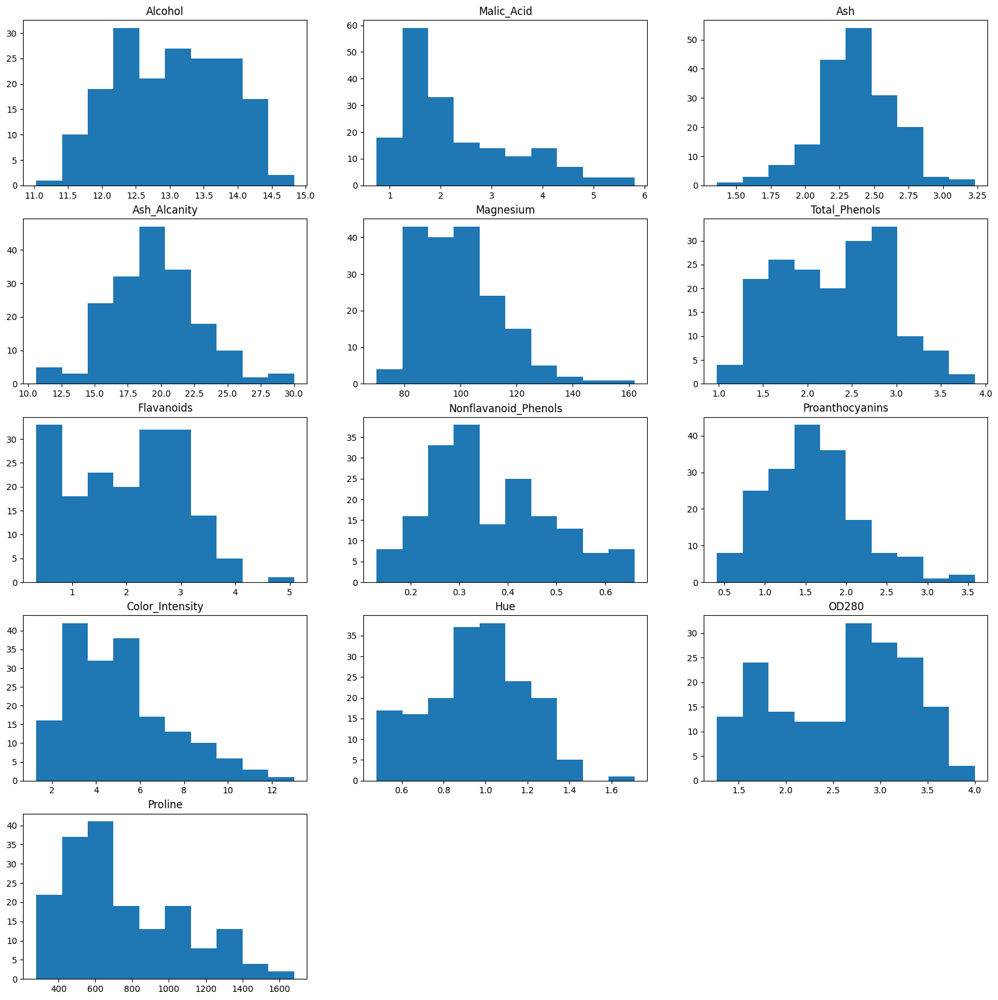

In [30]:
#plotting histogram for each column
plt.figure(figsize=(20,20))
for index, column in zip(range(1,14),wine.columns):
    plt.subplot(5,3,index)
    plt.hist( wine[column])
    plt.title(column)

##PCA

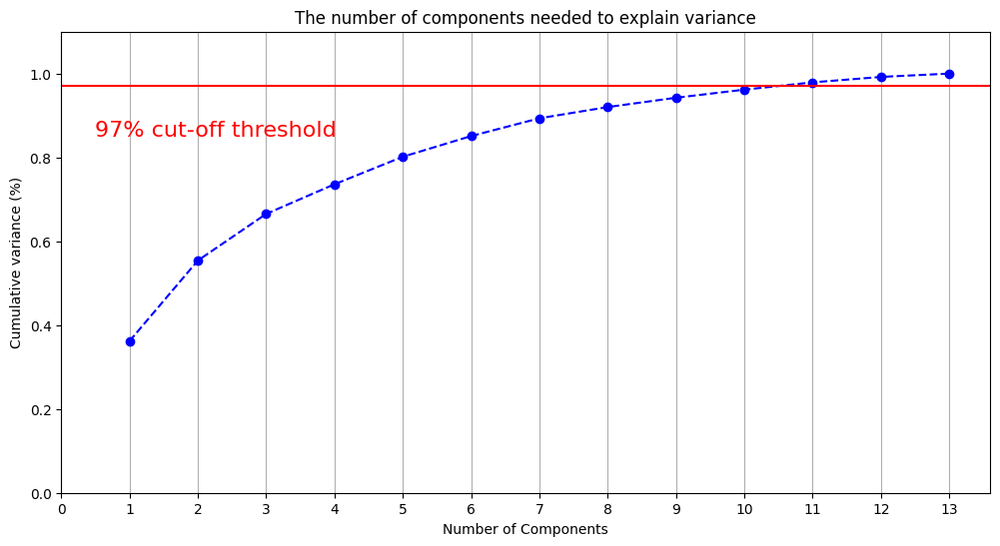

In [31]:
from sklearn.decomposition import PCA
pca = PCA().fit(scaled_df)


plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 14, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 14, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.97, color='r', linestyle='-')
plt.text(0.5, 0.85, '97% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()


In [32]:
#Trying with 10 components
pca = PCA(n_components=10)
x_pca =pca.fit_transform(scaled_df)
x_pca.shape

(178, 10)

In [33]:
wcss=[]
for i in range(2,20):
    kmeans = KMeans(n_clusters=i, init="k-means++", random_state=42)
    kmeans.fit(x_pca)
    wcss.append(kmeans.inertia_)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

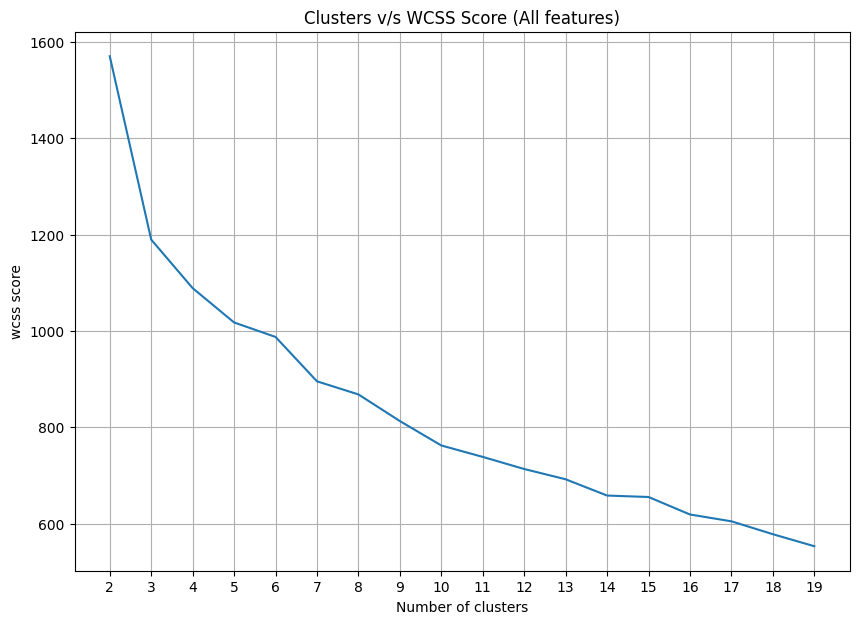

In [34]:
# plotting the elbow curve

plt.figure(figsize=(10,7))
plt.plot(range(2,20), wcss)
plt.xticks(np.arange(2,20,1))
plt.xlabel("Number of clusters")
plt.ylabel("wcss score")
plt.grid(True)
plt.title("Clusters v/s WCSS Score (All features)")
plt.show()

No of clusters:3

In [35]:
# fitting on the reduced data with 3 clusters
optimal_kmeans = KMeans(n_clusters=3, init="k-means++", random_state=42)
y_kmeans_optimal = optimal_kmeans.fit_predict(x_pca)
y_kmeans_optimal

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int32)

In [36]:
len(y_kmeans_optimal)

178

In [37]:
#making the PCA data as dataframe
pca_df = pd.DataFrame(x_pca)
pca_df['clusters'] = y_kmeans_optimal
pca_df.head()

,0,1,2,3,4,5,6,7,8,9,clusters
0,3.316751,-1.443463,-0.165739,-0.215631,0.693043,-0.223880,0.596427,0.065139,0.641443,1.020956,0
1,2.209465,0.333393,-2.026457,-0.291358,-0.257655,-0.927120,0.053776,1.024416,-0.308847,0.159701,0
2,2.516740,-1.031151,0.982819,0.724902,-0.251033,0.549276,0.424205,-0.344216,-1.177834,0.113361,0
3,3.757066,-2.756372,-0.176192,0.567983,-0.311842,0.114431,-0.383337,0.643593,0.052544,0.239413,0
4,1.008908,-0.869831,2.026688,-0.409766,0.298458,-0.406520,0.444074,0.416700,0.326819,-0.078366,0


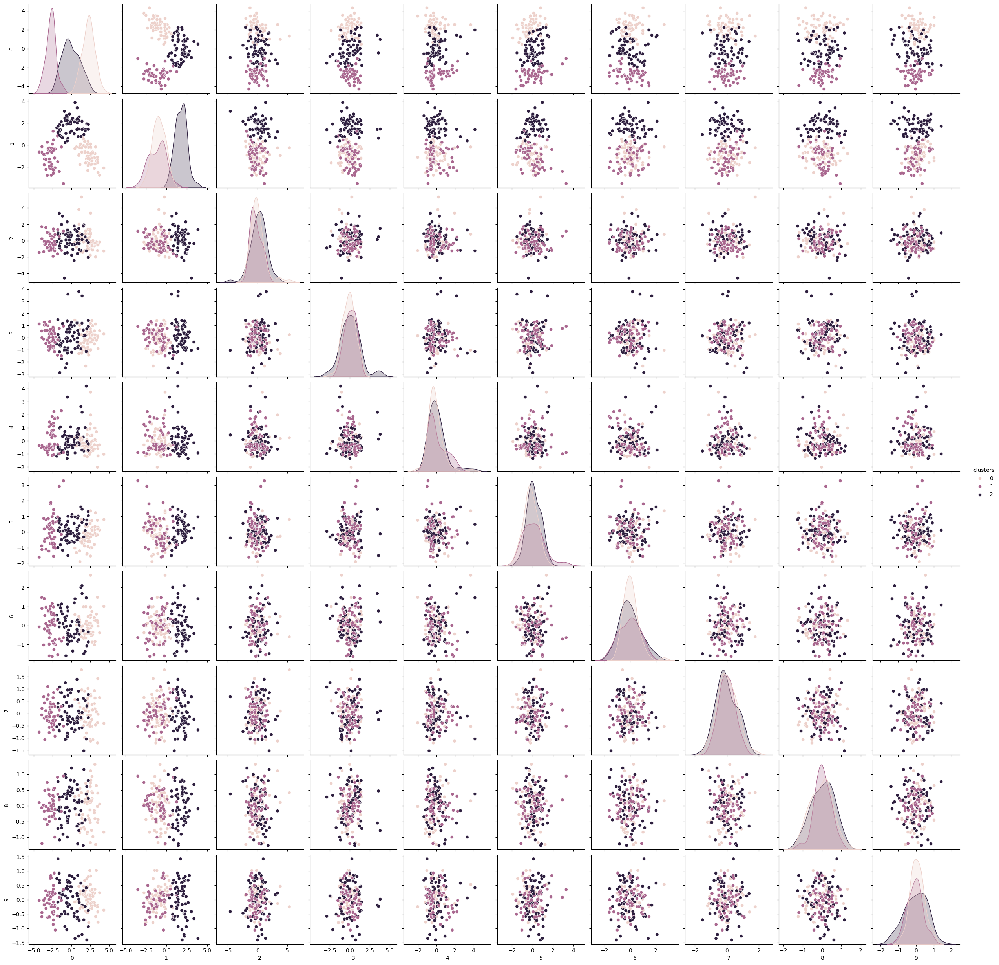

In [38]:
#doing a pairplot
sns.pairplot(data=pca_df, hue='clusters')

In [39]:
#checking the accuracy of the clustering through silouhette score
from sklearn.metrics import silhouette_score
silhouette_score(x_pca, y_kmeans_optimal)

0.29867482943692897

Lowest score compare to the orginal data

In [40]:
# trying scaling on the original data and trying kmeans
wcss=[]
for i in range(2,20):
    kmeans = KMeans(n_clusters=i, init="k-means++", random_state=42)
    kmeans.fit(scaled_df.values)
    wcss.append(kmeans.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

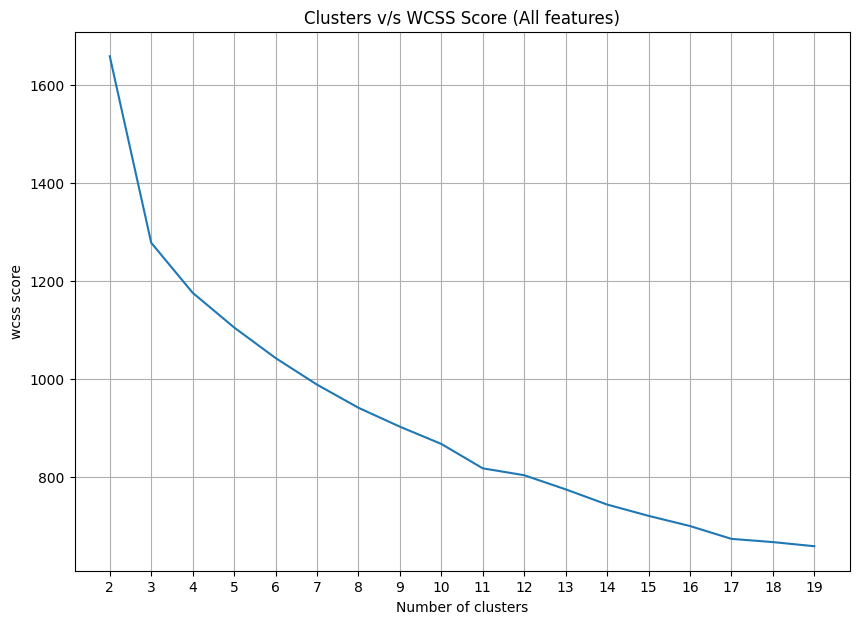

In [41]:

# plotting the elbow curve

plt.figure(figsize=(10,7))
plt.plot(range(2,20), wcss)
plt.xticks(np.arange(2,20,1))
plt.xlabel("Number of clusters")
plt.ylabel("wcss score")
plt.grid(True)
plt.title("Clusters v/s WCSS Score (All features)")
plt.show()


In [42]:
#fitting on 3 clusters with scaled data
k_means_3 = KMeans(n_clusters=3, init='k-means++', random_state=42)
y_kmeans_3 = k_means_3.fit_predict(scaled_df.values)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [43]:
len(y_kmeans_3)

178

In [44]:
# chekcing the silhouette score
silhouette_score(scaled_df.values, y_kmeans_3)

0.2848589191898987

In [45]:
#doing box cox transformation on the data
from scipy import stats
transformed_df = pd.DataFrame()
for column in scaled_df.columns:
    transformed_df[column], lambda_ = stats.boxcox(wine[column])
transformed_df.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,21.927545,0.498435,1.787608,8.226937,0.699041,1.496316,1.734838,-1.078493,1.057792,1.848571,0.039910,4.035440,4.968741
1,19.868336,0.532808,1.374804,6.245109,0.698760,1.386825,1.508768,-1.130654,0.264986,1.563014,0.049860,3.188416,4.961832
2,19.789201,0.763944,2.145671,9.478776,0.698774,1.496316,1.867648,-1.028992,1.405015,1.856632,0.029949,2.828647,5.020418
3,22.210560,0.609549,1.890549,8.735865,0.698915,2.217519,2.048911,-1.185841,0.980108,2.222884,-0.141185,3.267868,5.126201
4,19.947535,0.836270,2.454813,10.435768,0.698964,1.496316,1.455100,-0.832162,0.713148,1.547593,0.039910,2.463578,4.784747


In [46]:
#checking the correlation matrix
plot_corr_matrix(transformed_df)

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
Alcohol,,,,,,,,,,,,,
Malic_Acid,,,,,,,,,,,,,
Ash,,,,,,,,,,,,,
Ash_Alcanity,,,,,,,,,,,,,
Magnesium,,,,,,,,,,,,,
Total_Phenols,,,,,,,0.856664,,,,,0.702977,
Flavanoids,,,,,,0.856664,,,,,,0.793704,
Nonflavanoid_Phenols,,,,,,,,,,,,,
Proanthocyanins,,,,,,,,,,,,,
Color_Intensity,,,,,,,,,,,,,


In [47]:
#normalizing the transformed data with Standard scaler
scaled_transformed_data = StandardScaler().fit_transform(transformed_df)
scaled_transformed_df = pd.DataFrame(scaled_transformed_data, columns=wine.columns)
scaled_transformed_df.head()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,1.529934,-0.419936,0.209656,-1.180096,1.690664,0.820429,1.017090,-0.590039,1.196442,0.448300,0.373318,1.995073,1.062489
1,0.238692,-0.324973,-0.840423,-2.662695,0.188122,0.594628,0.752148,-0.788009,-0.485294,-0.106644,0.416623,1.143947,1.029691
2,0.189069,0.313578,1.120488,-0.243599,0.261441,0.820429,1.172735,-0.402165,1.932988,0.463965,0.329965,0.782435,1.307819
3,1.707400,-0.112964,0.471514,-0.799368,1.020309,2.307762,1.385166,-0.997460,1.031657,1.175730,-0.414883,1.223784,1.810015
4,0.288354,0.513388,1.906875,0.472325,1.281944,0.820429,0.689251,0.344871,0.465369,-0.136613,0.373318,0.415598,0.188997


In [48]:
# trying scaling on the original data and trying kmeans
wcss=[]
for i in range(2,20):
    kmeans = KMeans(n_clusters=i, init="k-means++", random_state=42)
    kmeans.fit(scaled_transformed_df.values)
    wcss.append(kmeans.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

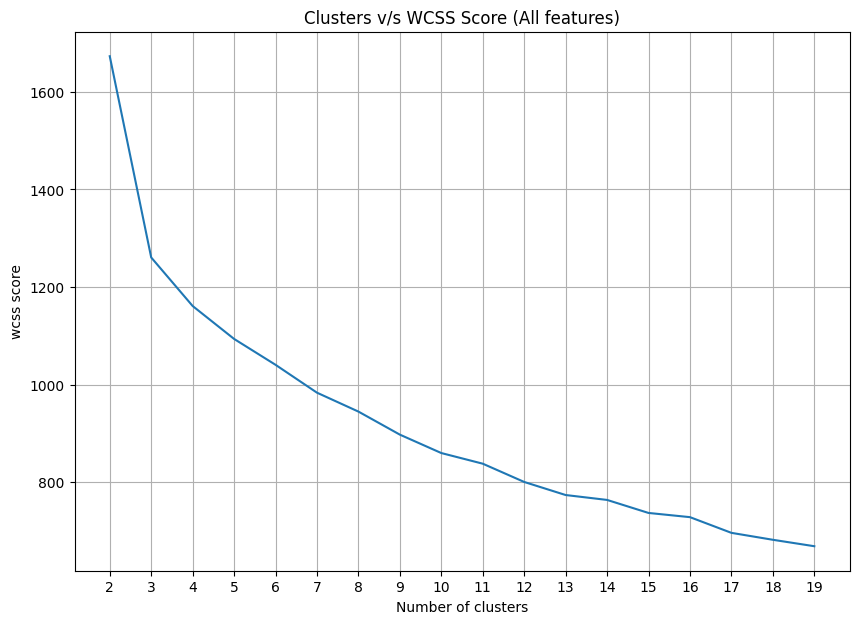

In [49]:
# plotting the elbow curve

plt.figure(figsize=(10,7))
plt.plot(range(2,20), wcss)
plt.xticks(np.arange(2,20,1))
plt.xlabel("Number of clusters")
plt.ylabel("wcss score")
plt.grid(True)
plt.title("Clusters v/s WCSS Score (All features)")
plt.show()


In [50]:

#fitting on 3 clusters with scaled transformed data
k_means_3 = KMeans(n_clusters=3, init='k-means++', random_state=42)
y_kmeans_3 = k_means_3.fit_predict(scaled_transformed_df.values)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [51]:
len(y_kmeans_3)

178

In [52]:
# chekcing the silhouette score
silhouette_score(scaled_transformed_df.values, y_kmeans_3)

0.3018590929962719

After Scaling and Transformations there has been no impact on the clustering accuracy

##Agglomerative Clustering

#Optimum number of clusters needed using dendrogram method

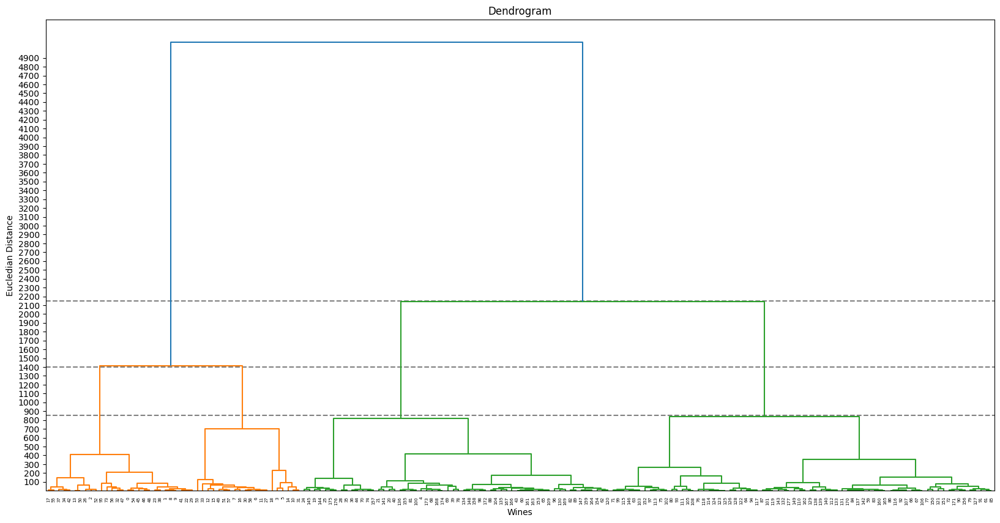

In [53]:
# creating dendrogram
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(20,10))
plt.title("Dendrogram")
plt.yticks(np.arange(100,5000,100))
plt.xlabel("Wines")
y_lines = [850, 1400, 2150]
for y in y_lines:
    plt.axhline(y=y, color='gray', linestyle='--')
plt.ylabel('Eucledian Distance')
dendrogram = sch.dendrogram(sch.linkage(wine.values, method='ward'));

Dendrogram shows 3 clusters

In [54]:
from sklearn.cluster import AgglomerativeClustering
hc_agg_cluster = AgglomerativeClustering(n_clusters=3, metric="euclidean", linkage='ward')
y_hc = hc_agg_cluster.fit_predict(wine.values)

In [55]:
y_hc

array([0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2,
       0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 2, 2, 0, 0, 2,
       2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 1, 2, 1, 1, 2,
       1, 1, 2, 2, 2, 1, 1, 0, 2, 1, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 1,
       2, 2, 1, 1, 1, 1, 1, 0, 2, 1, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 2,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1,
       1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 1, 2,
       2, 2, 1, 2, 2, 2, 1, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2,
       2, 1])

In [56]:
#checking the silhouette score
silhouette_score(wine.values, y_hc)

0.5644796401732071

In [57]:
#creating a copy of original df and appending the cluster
agg_df = wine.copy(deep=True)
agg_df['cluster'] = y_hc

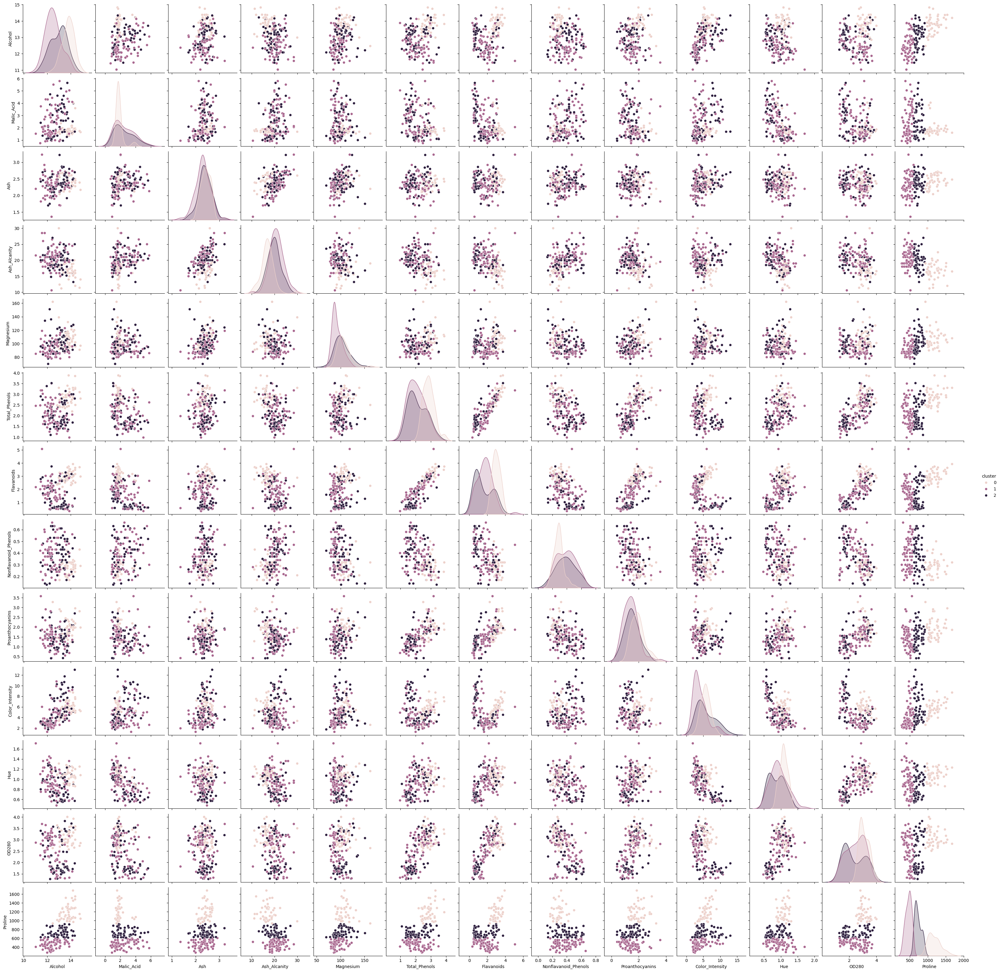

In [58]:
#pair plot to represent the cluster
sns.pairplot(agg_df, hue='cluster');

##Density Based Clustering

In [59]:
X, y_true = make_blobs(n_samples=300, centers=4,
                       cluster_std=0.50, random_state=0)

In [60]:
db = DBSCAN(eps=0.3, min_samples=10).fit(X)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

In [61]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

['y', 'b', 'g', 'r']


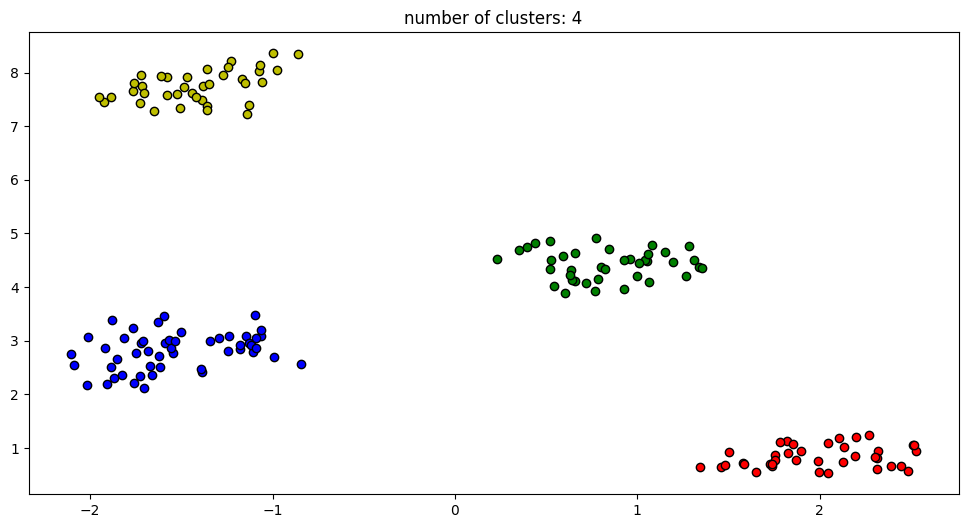

In [62]:
unique_labels = set(labels)
colors = ['y', 'b', 'g', 'r']
print(colors)
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = 'k'

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
             markeredgecolor='k',
             markersize=6)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
             markeredgecolor='k',
             markersize=6)

plt.title('number of clusters: %d' % n_clusters_)
plt.show()

In [63]:

# evaluation metrics
sc = metrics.silhouette_score(X, labels)
print("Silhouette Coefficient:%0.2f" % sc)


Silhouette Coefficient:0.13
